<a href="https://colab.research.google.com/github/peteray-dev/face-expression-detection/blob/master/Face_expression_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Wed Jan 15 17:39:55 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off | 00000000:00:04.0 Off |                    0 |
| N/A   31C    P0              47W / 400W |      2MiB / 40960MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [2]:
!git clone https://github.com/ultralytics/yolov5  # clone
# cd yolov5
# pip install -r requirements.txt  # install

Cloning into 'yolov5'...
remote: Enumerating objects: 17265, done.
remote: Counting objects: 100% (198/198), done.
remote: Compressing objects: 100% (165/165), done.
remote: Total 17265 (delta 90), reused 51 (delta 33), pack-reused 17067 (from 3)
Receiving objects: 100% (17265/17265), 16.10 MiB | 28.09 MiB/s, done.
Resolving deltas: 100% (11794/11794), done.


In [3]:
%pwd

'/content'

In [4]:
cd yolov5

/content/yolov5


In [5]:
%pwd

'/content/yolov5'

In [6]:
!pip install -qr requirements.txt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 906.9/906.9 kB 18.2 MB/s eta 0:00:00


In [7]:
from IPython.display import Image, clear_output  # to display images
# from utils.google_utils import gdrive_download  # to download models/datasets
import torch
# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 2.5.1+cu121 _CudaDeviceProperties(name='NVIDIA A100-SXM4-40GB', major=8, minor=0, total_memory=40513MB, multi_processor_count=108, uuid=34f8d924-285f-2d48-db44-a8411e60fbfe, L2_cache_size=40MB)


In [8]:
cd ..

/content


In [9]:
# !kaggle datasets download -d jonathanoheix/face-expression-recognition-dataset

In [10]:
# !unzip /content/face-expression-recognition-dataset.zip

In [11]:
# https://github.com/peteray-dev/data-store/raw/refs/heads/master/images.zip

%cd /content
!curl -L "https://github.com/peteray-dev/data-store/raw/refs/heads/master/clearface_v2.zip" > clearface.zip; unzip clearface.zip; rm clearface.zip


/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 5708k  100 5708k    0     0  8346k      0 --:--:-- --:--:-- --:--:-- 8346k
Archive:  clearface.zip
   creating: clearface_v2/
  inflating: clearface_v2/data.yaml  
  inflating: clearface_v2/README.dataset.txt  
  inflating: clearface_v2/README.roboflow.txt  
   creating: clearface_v2/test/
   creating: clearface_v2/test/images/
  inflating: clearface_v2/test/images/Disgust_b9f188e5-d345-11ef-ae0d-40234374a18a_jpg.rf.29cd34d3777494461108e76488e8c6c2.jpg  
  inflating: clearface_v2/test/images/Fear_c7de0fca-d345-11ef-8954-40234374a18a_jpg.rf.c3980e594a515451644991fa53d4a121.jpg  
  inflating: clearface_v2/test/images/Fear_d2c40498-d345-11ef-b68a-40234374a18a_jpg.rf.be7b6086505c56f959610bfe5aba7371.jpg  
  inflating: clearface_v2/test/images/H

In [12]:


# this is the YAML file  we're loading into this notebook with our data
%cat ./clearface_v2/data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 7
names: ['Angry', 'Disgust', 'Fear', 'Happy', 'Neutral', 'Sad', 'Surprise']

roboflow:
  workspace: face-image
  project: clearface-bvile
  version: 2
  license: CC BY 4.0
  url: https://universe.roboflow.com/face-image/clearface-bvile/dataset/2

In [13]:
import yaml
with open("./clearface_v2/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [14]:
num_classes

'7'

In [15]:
%cat yolov5/models/yolov5m.yaml

# Ultralytics 🚀 AGPL-3.0 License - https://ultralytics.com/license

# Parameters
nc: 80 # number of classes
depth_multiple: 0.67 # model depth multiple
width_multiple: 0.75 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, 

In [16]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [17]:
%%writetemplate /content/yolov5/models/custom_yolov5.yaml

# Parameters
nc: {num_classes} # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 4], 1, Concat, [1]], # cat backbone P3
    [-1, 3, C3, [256, False]], # 17 (P3/8-small)

    [-1, 1, Conv, [256, 3, 2]],
    [[-1, 14], 1, Concat, [1]], # cat head P4
    [-1, 3, C3, [512, False]], # 20 (P4/16-medium)

    [-1, 1, Conv, [512, 3, 2]],
    [[-1, 10], 1, Concat, [1]], # cat head P5
    [-1, 3, C3, [1024, False]], # 23 (P5/32-large)

    [[17, 20, 23], 1, Detect, [nc, anchors]], # Detect(P3, P4, P5)
  ]



In [18]:
import os
import yaml

# Paths to dataset
train_path = "/content/clearface_v2/train"
val_path = "/content/clearface_v2/test"

# Path to the existing data.yaml file
data_yaml_path = "/content/clearface_v2/data.yaml"

# Update train and val paths
try:
    # Load the existing data.yaml
    if os.path.exists(data_yaml_path):
        with open(data_yaml_path, "r") as file:
            data_yaml_content = yaml.safe_load(file)
    else:
        data_yaml_content = {}

    # Update only train and val keys
    data_yaml_content["train"] = train_path
    data_yaml_content["val"] = val_path

    # Write the updated content back to data.yaml
    with open(data_yaml_path, "w") as file:
        yaml.dump(data_yaml_content, file)

    print("data.yaml updated successfully!")

except Exception as e:
    print(f"An error occurred: {e}")


data.yaml updated successfully!


In [19]:
# # Generate a label
# import os

# # Define dataset paths
# train_dir = "/content/images/train"
# val_dir = "/content/images/test"
# label_dirs = [("train", train_dir), ("validation", val_dir)]

# # Get class names from folder names
# class_names = sorted(os.listdir(train_dir))
# class_map = {name: idx for idx, name in enumerate(class_names)}
# print("Class Mapping:", class_map)

# # Function to create labels
# def create_labels(image_dir, label_dir, class_map):
#     for class_name, class_id in class_map.items():
#         class_path = os.path.join(image_dir, class_name)
#         label_path = os.path.join(label_dir, class_name)
#         os.makedirs(label_path, exist_ok=True)

#         # Process each image
#         for img_file in os.listdir(class_path):
#             if img_file.endswith((".jpg", ".png", ".jpeg")):
#                 label_file = os.path.splitext(img_file)[0] + ".txt"
#                 label_content = f"{class_id} 0.5 0.5 1.0 1.0\n"

#                 # Save label
#                 with open(os.path.join(label_path, label_file), "w") as f:
#                     f.write(label_content)

# # Generate labels for train and val
# for label_dir_name, image_dir in label_dirs:
#     create_labels(image_dir, f"/content/labels/{label_dir_name}", class_map)

# print("Labels generated successfully!")


## Training

In [20]:
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 800 --data '/content/clearface_v2/data.yaml' --cfg ./models/custom_yolov5.yaml --weights 'yolov5s.pt' --name yolov5s_results --cache

Streaming output truncated to the last 5000 lines.
  with torch.cuda.amp.autocast(amp):
    189/799      1.65G    0.02631    0.01082    0.03021         42        416:  33% 4/12 [00:00<00:00, 14.13it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
    189/799      1.65G    0.02559    0.01065    0.02926         38        416:  33% 4/12 [00:00<00:00, 14.13it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
    189/799      1.65G    0.02575    0.01049    0.02918         40        416:  50% 6/12 [00:00<00:00, 14.31it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
   

## Evaluation

In [21]:
# load tensorboard and save the logs in run
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

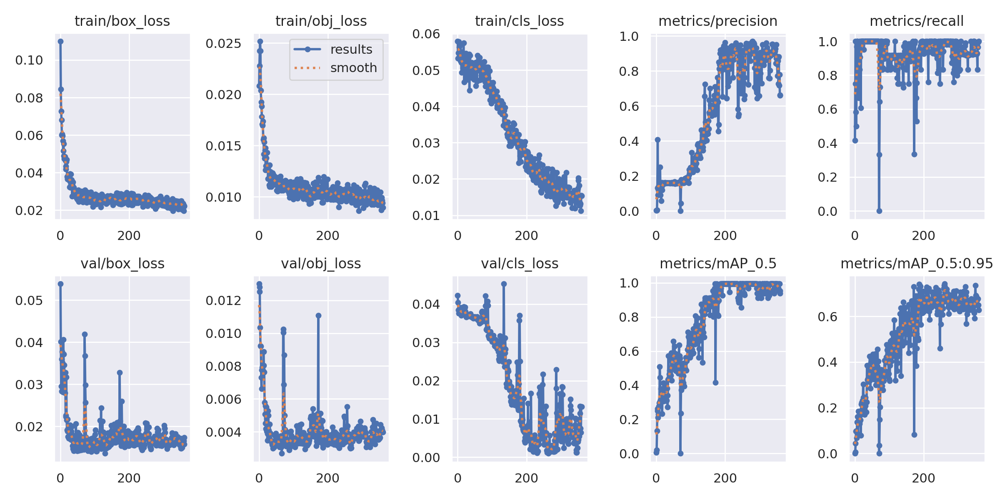

In [22]:
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)

GROUND TRUTH TRAINING DATA:


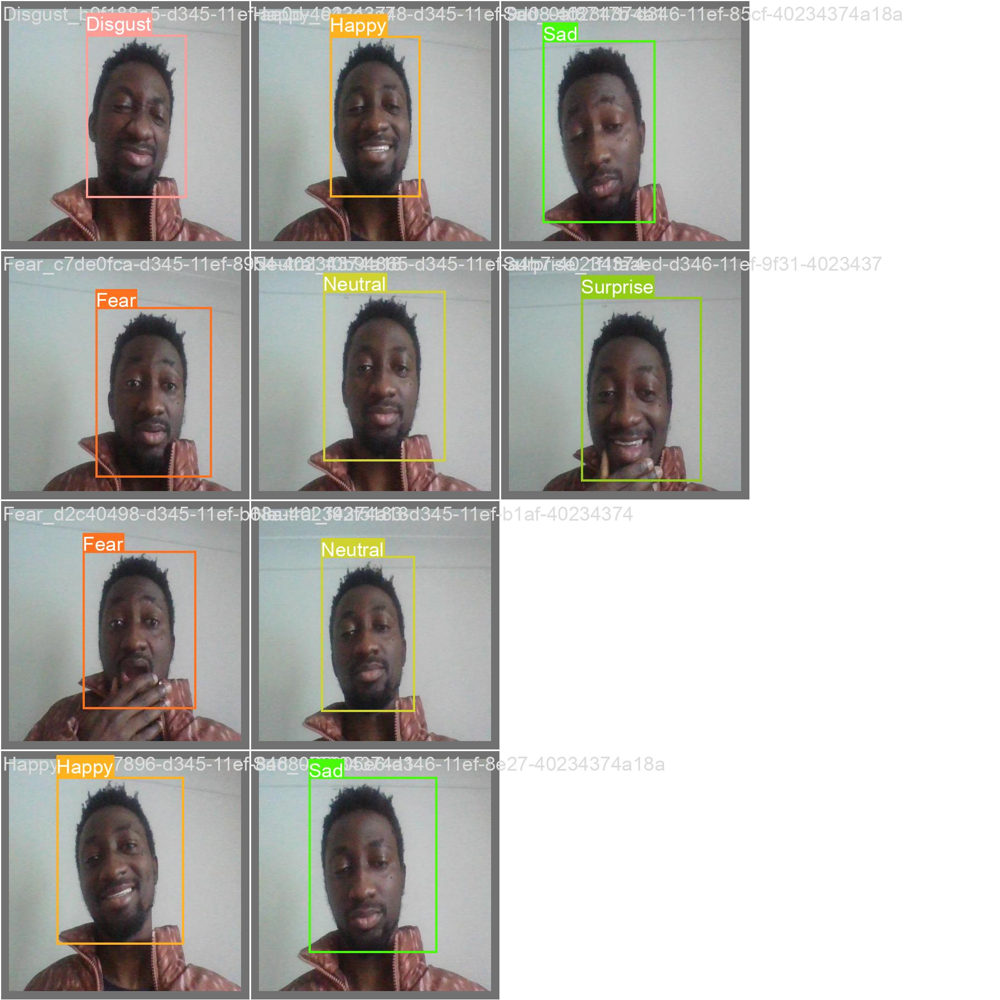

In [23]:
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


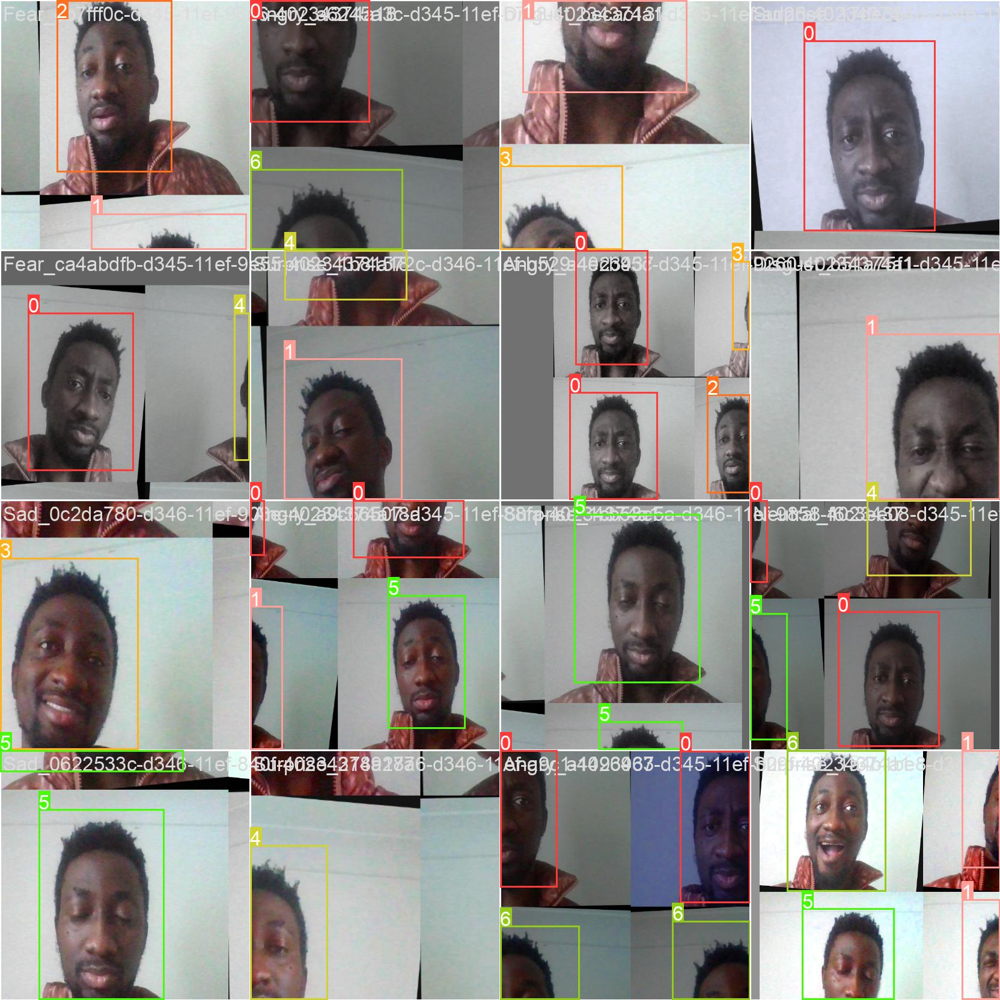

In [24]:
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

In [25]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [26]:
%pwd

'/content/yolov5'

In [27]:
import os
import shutil

validation_dir = "/content/clearface_v2/test"
output_dir = "/content/clearface_v2/validation_flattened"

# Create the output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

# Move images from subfolders to the main directory
for folder in os.listdir(validation_dir):
    folder_path = os.path.join(validation_dir, folder)
    if os.path.isdir(folder_path):  # Check if it's a directory
        for file in os.listdir(folder_path):
            if file.endswith(('bmp', 'dng', 'jpeg', 'jpg', 'png', 'tif', 'tiff', 'webp', 'pfm')):
                source = os.path.join(folder_path, file)
                destination = os.path.join(output_dir, file)
                shutil.move(source, destination)

print(f"Flattened images saved in {output_dir}")


Flattened images saved in /content/clearface_v2/validation_flattened


In [28]:
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.5 --source ../images/validation_flattened

/content/yolov5
detect: weights=['/content/yolov5/runs/train/yolov5s_results/weights/best.pt'], source=../images/validation_flattened, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-397-gde62f93c Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

Fusing layers... 
custom_YOLOv5 summary: 157 layers, 7029004 parameters, 0 gradients, 15.8 GFLOPs
Traceback (most recent call last):
  File "/content/yolov5/detect.py", line 438, in <module>
    main(opt)
  File "/content/yolov5/detect.py", line 433, in main
    run(**vars(opt))
  File "/usr/local/lib/python3.11/dist-packages/torch/uti

In [29]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

## Getting the trained model

In [30]:
# from google.colab import drive
# drive.mount('/content/gdrive')

In [31]:
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt /content/gdrive/MyDrive/face_detection


cp: cannot create regular file '/content/gdrive/MyDrive/face_detection': No such file or directory


In [35]:
%pwd

'/content/yolov5'

In [36]:
!python export.py --weights best.pt --img-size 416 --batch-size 1


export: data=data/coco128.yaml, weights=['best.pt'], imgsz=[416], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, per_tensor=False, dynamic=False, cache=, simplify=False, mlmodel=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript']
YOLOv5 🚀 v7.0-397-gde62f93c Python-3.11.11 torch-2.5.1+cu121 CPU

Traceback (most recent call last):
  File "/content/yolov5/export.py", line 1546, in <module>
    main(opt)
  File "/content/yolov5/export.py", line 1541, in main
    run(**vars(opt))
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/_contextlib.py", line 116, in decorate_context
    return func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^
  File "/content/yolov5/export.py", line 1385, in run
    model = attempt_load(weights, device=device, inplace=True, fuse=True)  # load FP32 model
            ^^^^^^^^^^^^^^^^^^^^^^^^^^

In [37]:
!ls


benchmarks.py	 data	     LICENSE	     README.md	       segment	       val.py
CITATION.cff	 detect.py   models	     README.zh-CN.md   train.py        yolov5s.pt
classify	 export.py   __pycache__     requirements.txt  tutorial.ipynb
CONTRIBUTING.md  hubconf.py  pyproject.toml  runs	       utils


In [38]:
!python export.py --weights runs/train/yolov5s_results/weights/best.pt --img-size 416 --batch-size 1


export: data=data/coco128.yaml, weights=['runs/train/yolov5s_results/weights/best.pt'], imgsz=[416], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, per_tensor=False, dynamic=False, cache=, simplify=False, mlmodel=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript']
YOLOv5 🚀 v7.0-397-gde62f93c Python-3.11.11 torch-2.5.1+cu121 CPU

Fusing layers... 
custom_YOLOv5 summary: 157 layers, 7029004 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from runs/train/yolov5s_results/weights/best.pt with output shape (1, 10647, 12) (13.7 MB)

TorchScript: starting export with torch 2.5.1+cu121...
TorchScript: export success ✅ 1.4s, saved as runs/train/yolov5s_results/weights/best.torchscript (27.2 MB)

Export complete (1.8s)
Results saved to /content/yolov5/runs/train/yolov5s_results/weights
Detect:          python detect.py --weights 

In [40]:
!python detect.py --weights runs/train/yolov5s_results/weights/best.torchscript --img 416 --conf 0.25 --source /content/img.jpg


detect: weights=['runs/train/yolov5s_results/weights/best.torchscript'], source=/content/img.jpg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-397-gde62f93c Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

Loading runs/train/yolov5s_results/weights/best.torchscript for TorchScript inference...
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/img.jpg: 416x416 1 Fear, 3.4ms
Speed: 6.8ms pre-process, 3.4ms inference, 607.1ms NMS per image at shape (1, 3, 416, 416)
Results saved to runs/detect/exp3
